In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.express as px

In [4]:
path = '../cs5228-2310-final-project/'
df_train = pd.read_csv(path + 'train.csv')
df_test = pd.read_csv(path + 'test.csv')
path_auxiliary = '../cs5228-2310-final-project/auxiliary-data/auxiliary-data/'



In [5]:
def from_lat_long_to_dis(latA, lonA, latB, lonB):
    ra = 6378140
    rb = 6356755
    flatten = (ra - rb) / ra

    rad_lat_A = np.radians(latA)
    rad_lng_A = np.radians(lonA)
    rad_lat_B = np.radians(latB)
    rad_lng_B = np.radians(lonB)

    pA = np.arctan(rb / ra * np.tan(rad_lat_A))
    pB = np.arctan(rb / ra * np.tan(rad_lat_B))
    x = np.arccos(np.sin(pA) * np.sin(pB) + np.cos(pA) * np.cos(pB) * np.cos(rad_lng_A - rad_lng_B))
    c1 = (np.sin(x) - x) * (np.sin(pA) + np.sin(pB)) ** 2 / np.cos(x / 2) ** 2
    c2 = (np.sin(x) + x) * (np.sin(pA) - np.sin(pB)) ** 2 / np.sin(x / 2) ** 2
    dr = flatten / 8 * (c1 - c2)
    distance = ra * (x + dr)
    distance /= 1000 # convert to km
    return distance




In [8]:
df_primary = pd.read_csv(path_auxiliary + 'sg-primary-schools.csv')

In [23]:
#plot geo attributes by data
px.scatter(df_train, x="longitude", y="latitude", color="rent_approval_date", title='train data',opacity=0.7)

In [ ]:
px.scatter(df_primary, x="longitude", y="latitude", color="school_name", title='primary school',opacity=0.7)

In [20]:
px.scatter_3d(df_train, x="longitude", y="latitude", z="monthly_rent", color="rent_approval_date", title='train data', opacity=0.7)

In [26]:
px.scatter_3d(df_train, x="longitude", y="latitude", z="monthly_rent", title='test data', opacity=0.1, animation_frame="rent_approval_date", animation_group="rent_approval_date")

In [6]:
from_lat_long_to_dis(26.08, 119.28, 24.26, 118.04)# fuzhou to xiamen

237.2152647407692

In [7]:
df_dis_primary = df_train[['latitude', 'longitude', 'monthly_rent']].copy()
df_dis_primary

,latitude,longitude,monthly_rent
0,1.344518,103.738630,1600
1,1.330186,103.938717,2250
2,1.332242,103.845643,1900
3,1.370239,103.962894,2850
4,1.320502,103.863341,2100
...,...,...,...
59995,1.366050,103.854168,2200
59996,1.286493,103.821434,4100
59997,1.355064,103.936507,2250
59998,1.318974,103.944076,4700


In [17]:
df_primary


,name,latitude,longitude
0,Admiralty Primary School,1.454038,103.817436
1,Ahmad Ibrahim Primary School,1.433153,103.832942
2,Ai Tong School,1.360583,103.833020
3,Alexandra Primary School,1.291334,103.824425
4,Anchor Green Primary School,1.390370,103.887165
...,...,...,...
180,Yuhua Primary School,1.342802,103.741106
181,Yumin Primary School,1.351292,103.950462
182,Zhangde Primary School,1.284212,103.825952
183,Zhenghua Primary School,1.379549,103.769314


In [18]:
school_names = df_primary['name'].unique()
len(school_names)

185

In [19]:
for name in school_names:
    df_dis_primary[name] = from_lat_long_to_dis(df_dis_primary['latitude'], df_dis_primary['longitude'], df_primary[df_primary['name'] == name]['latitude'].values[0], df_primary[df_primary['name'] == name]['longitude'].values[0])

df_dis_primary

C:\Users\Concyclics\AppData\Local\Temp\ipykernel_39328\493490657.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_dis_primary[name] = from_lat_long_to_dis(df_dis_primary['latitude'], df_dis_primary['longitude'], df_primary[df_primary['name'] == name]['latitude'].values[0], df_primary[df_primary['name'] == name]['longitude'].values[0])
C:\Users\Concyclics\AppData\Local\Temp\ipykernel_39328\493490657.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_dis_primary[name] = from_lat_long_to_dis(df_dis_primary['latitude'], df

,latitude,longitude,monthly_rent,Admiralty Primary School,Ahmad Ibrahim Primary School,Ai Tong School,Alexandra Primary School,Anchor Green Primary School,Anderson Primary School,Anglo-Chinese School (Junior),...,Yangzheng Primary School,Yew Tee Primary School,Yio Chu Kang Primary School,Yishun Primary School,Yu Neng Primary School,Yuhua Primary School,Yumin Primary School,Zhangde Primary School,Zhenghua Primary School,Zhonghua Primary School
0,1.344518,103.738630,1600,14.952262,14.360174,10.653690,11.213788,17.290231,12.251582,12.032840,...,14.470897,5.938693,16.772884,13.745374,21.568148,0.334495,23.586410,11.785907,5.163741,14.696229
1,1.330186,103.938717,2250,19.228090,16.376670,12.233653,13.425490,8.786420,12.372145,11.121670,...,8.066275,22.151410,7.922128,16.170188,0.838228,22.036209,2.674938,13.540190,19.626900,8.360920
2,1.332242,103.845643,1900,13.828599,11.247345,3.434281,5.102653,7.916157,5.771766,2.584567,...,3.132845,12.722954,6.733625,10.688983,9.628475,11.692346,11.853862,5.745337,9.976012,4.094416
3,1.370239,103.962894,2850,18.651919,16.048104,14.492803,17.708678,8.716699,13.610334,15.149342,...,10.762536,23.764423,8.639035,16.052433,5.278762,24.868259,2.510666,17.965308,21.567739,10.423698
4,1.320502,103.863341,2100,15.624570,12.907600,5.570404,5.399975,8.167971,7.461696,2.780286,...,3.166486,15.081771,6.818225,12.405335,7.798923,13.825234,10.276000,5.780752,12.334083,4.447783
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,1.366050,103.854168,2200,10.553134,7.786778,2.429912,8.900157,4.551512,2.465331,6.439843,...,2.506311,11.974650,3.741134,7.309887,9.378311,12.842483,10.839911,9.578666,9.560535,1.851961
59996,1.286493,103.821434,4100,18.531713,16.267439,8.293453,0.630436,13.617862,11.036916,3.332565,...,8.647586,14.496449,12.381265,15.644769,13.389431,10.894351,16.047964,0.562558,11.811962,9.765238
59997,1.355064,103.936507,2250,17.186073,14.401112,11.533060,14.326563,6.737481,11.066668,11.774670,...,7.591053,21.154900,6.199655,14.277889,2.391167,21.788236,1.608034,14.586304,18.802606,7.449635
59998,1.318974,103.944076,4700,20.534578,17.673714,13.187935,13.662347,10.121164,13.517027,11.526162,...,9.018208,23.146404,9.208102,17.449239,2.117348,22.741668,3.643502,13.696611,20.570189,9.443617


In [20]:
df_dis_primary.drop(['latitude', 'longitude'], axis=1, inplace=True)

In [33]:
randoms = np.random.choice(school_names, 10000)
#select 10 school with shortest name
random_school = []
for name in randoms:
    if len(name) <= 15:
        random_school.append(name)
        if len(random_school) == 10:
            break

df_dis=df_dis_primary[random_school+ ['monthly_rent',]]

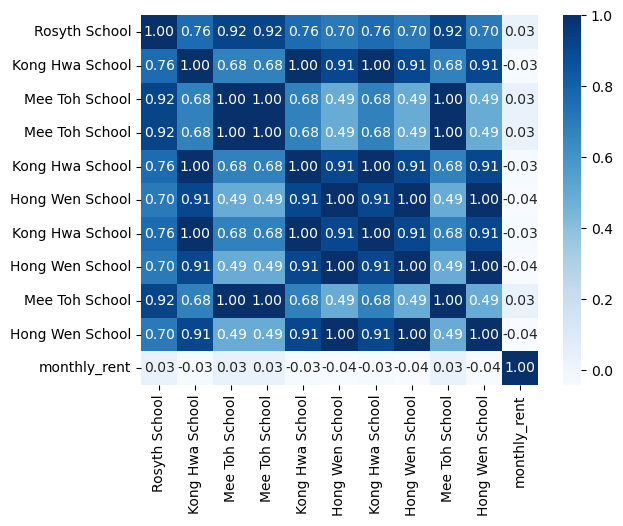

In [34]:
corr = df_dis.corr()
fig = sns.heatmap(corr, annot=True, fmt='.2f', cmap='Blues')
fig = fig.get_figure()
fig.savefig('corr.pdf')

In [23]:
df_dis_primary_1_d = df_dis_primary.copy()
for name in school_names:
    df_dis_primary_1_d[name] = df_dis_primary_1_d[name].apply(lambda x: 1/x if x != 0 else 0)

df_dis_primary_1_d

,monthly_rent,Admiralty Primary School,Ahmad Ibrahim Primary School,Ai Tong School,Alexandra Primary School,Anchor Green Primary School,Anderson Primary School,Anglo-Chinese School (Junior),Anglo-Chinese School (Primary),Angsana Primary School,...,Yangzheng Primary School,Yew Tee Primary School,Yio Chu Kang Primary School,Yishun Primary School,Yu Neng Primary School,Yuhua Primary School,Yumin Primary School,Zhangde Primary School,Zhenghua Primary School,Zhonghua Primary School
0,1600,0.066880,0.069637,0.093864,0.089176,0.057836,0.081622,0.083106,0.089499,0.042143,...,0.069104,0.168387,0.059620,0.072752,0.046365,2.989580,0.042397,0.084847,0.193658,0.068045
1,2250,0.052007,0.061062,0.081742,0.074485,0.113812,0.080827,0.089915,0.086588,0.400080,...,0.123973,0.045144,0.126229,0.061842,1.192993,0.045380,0.373840,0.073854,0.050950,0.119604
2,1900,0.072314,0.088910,0.291182,0.195976,0.126324,0.173257,0.386912,0.527082,0.083669,...,0.319199,0.078598,0.148508,0.093554,0.103859,0.085526,0.084361,0.174054,0.100240,0.244235
3,2850,0.053614,0.062313,0.069000,0.056469,0.114722,0.073474,0.066009,0.065435,0.370828,...,0.092915,0.042080,0.115754,0.062296,0.189438,0.040212,0.398301,0.055663,0.046366,0.095935
4,2100,0.064002,0.077474,0.179520,0.185186,0.122429,0.134018,0.359675,0.323077,0.096876,...,0.315807,0.066305,0.146666,0.080610,0.128223,0.072332,0.097314,0.172988,0.081076,0.224831
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,2200,0.094759,0.128423,0.411538,0.112358,0.219707,0.405625,0.155283,0.176607,0.090604,...,0.398993,0.083510,0.267299,0.136801,0.106629,0.077867,0.092252,0.104399,0.104597,0.539968
59996,4100,0.053962,0.061472,0.120577,1.586203,0.073433,0.090605,0.300069,0.258942,0.062304,...,0.115639,0.068982,0.080767,0.063919,0.074686,0.091791,0.062313,1.777594,0.084660,0.102404
59997,2250,0.058187,0.069439,0.086707,0.069800,0.148423,0.090361,0.084928,0.083757,0.540904,...,0.131734,0.047270,0.161299,0.070038,0.418206,0.045896,0.621877,0.068557,0.053184,0.134235
59998,4700,0.048698,0.056581,0.075827,0.073194,0.098803,0.073981,0.086759,0.082840,0.295686,...,0.110887,0.043203,0.108600,0.057309,0.472289,0.043972,0.274461,0.073011,0.048614,0.105892


In [24]:
corr = df_dis_primary_1_d.corr()
plt.figure(figsize=(100, 100))
fig = sns.heatmap(corr, annot=True, fmt='.2f', cmap='Blues')
fig = fig.get_figure()
fig.savefig('corr_1_d.pdf')

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x00000193A86C4EE0> (for post_execute):


KeyboardInterrupt: 

In [ ]:
dis_primary_in_1km = df_dis_primary.copy()
for name in school_names:
    dis_primary_in_1km[name] = dis_primary_in_1km[name].apply(lambda x: 1 if x <= 1 else 0)

dis_primary_in_1km

,monthly_rent,Admiralty Primary School,Ahmad Ibrahim Primary School,Ai Tong School,Alexandra Primary School,Anchor Green Primary School,Anderson Primary School,Anglo-Chinese School (Junior),Anglo-Chinese School (Primary),Angsana Primary School,...,Yangzheng Primary School,Yew Tee Primary School,Yio Chu Kang Primary School,Yishun Primary School,Yu Neng Primary School,Yuhua Primary School,Yumin Primary School,Zhangde Primary School,Zhenghua Primary School,Zhonghua Primary School
0,1600,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
1,2250,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
2,1900,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2850,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2100,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,2200,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
59996,4100,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
59997,2250,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
59998,4700,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
corr = dis_primary_in_1km.corr()
plt.figure(figsize=(100, 100))
fig = sns.heatmap(corr, annot=True, fmt='.2f', cmap='Blues')
fig = fig.get_figure()
fig.savefig('corr_1km.pdf')